In [108]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns

df = pd.read_csv("nyc_house_price_dataset.csv")
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [109]:
len(df)

48895

In [110]:
# data type per column
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [111]:
# checking if columns have null values
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [112]:
# removing irrelevant columns for future usage
df.drop(['id','host_name','last_review'], axis=1, inplace=True)
df.head()

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365
3,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0


In [113]:
# assigning 0 to nulls in reviews per month
df.fillna({'reviews_per_month':0}, inplace=True)
df.reviews_per_month.isnull().sum()

0

In [114]:
# check unique values for a categorical column
df.neighbourhood_group.unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [115]:
# check total length of neighbourhood
len(df.neighbourhood.unique())

221

In [116]:
df.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

In [117]:
# above we can see that these categorical fields are the most relevant as they have less unique values

# check unique values for all categorical values
for i in df.columns:
    print(f'{i} has: ', df[i].nunique(), ' unique values')

name has:  47905  unique values
host_id has:  37457  unique values
neighbourhood_group has:  5  unique values
neighbourhood has:  221  unique values
latitude has:  19048  unique values
longitude has:  14718  unique values
room_type has:  3  unique values
price has:  674  unique values
minimum_nights has:  109  unique values
number_of_reviews has:  394  unique values
reviews_per_month has:  938  unique values
calculated_host_listings_count has:  47  unique values
availability_365 has:  366  unique values


In [118]:
# what host (ids) have the most listings
top_host = df.host_id.value_counts().head(10)
top_host

219517861    327
107434423    232
30283594     121
137358866    103
12243051      96
16098958      96
61391963      91
22541573      87
200380610     65
7503643       52
Name: host_id, dtype: int64

In [119]:
# setting figure 
sns.set(rc={'figure.figsize':(10,8)})
sns.set_style('white')

In [120]:
# create df for top 10 hosts with most listings
top_host_df = pd.DataFrame(top_host)
top_host_df.reset_index(inplace=True)
top_host_df.rename(columns={'index':'host_id', 'host_id':'p_count'}, inplace=True)
top_host_df

,host_id,p_count
0,219517861,327
1,107434423,232
2,30283594,121
3,137358866,103
4,12243051,96
5,16098958,96
6,61391963,91
7,22541573,87
8,200380610,65
9,7503643,52


[Text(0, 0, '7503643'),
 Text(1, 0, '12243051'),
 Text(2, 0, '16098958'),
 Text(3, 0, '22541573'),
 Text(4, 0, '30283594'),
 Text(5, 0, '61391963'),
 Text(6, 0, '107434423'),
 Text(7, 0, '137358866'),
 Text(8, 0, '200380610'),
 Text(9, 0, '219517861')]

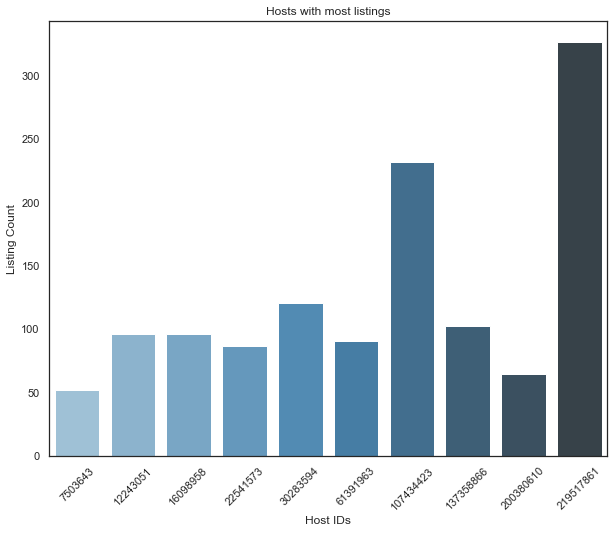

In [121]:
# bar plottingf top 10 hosts
viz_1 = sns.barplot(x="host_id", y="p_count", data=top_host_df, palette='Blues_d')
viz_1.set_title('Hosts with most listings')
viz_1.set_ylabel('Listing Count')
viz_1.set_xlabel('Host IDs')
viz_1.set_xticklabels(viz_1.get_xticklabels(), rotation=45)

In [122]:
# putting all prices per neighborhood in list

# #Brooklyn
# sub_1=df.loc[df['neighbourhood_group'] == 'Brooklyn']
# price_sub1=sub_1[['price']]
# #Manhattan
# sub_2=df.loc[df['neighbourhood_group'] == 'Manhattan']
# price_sub2=sub_2[['price']]
# #Queens
# sub_3=df.loc[df['neighbourhood_group'] == 'Queens']
# price_sub3=sub_3[['price']]
# #Staten Island
# sub_4=df.loc[df['neighbourhood_group'] == 'Staten Island']
# price_sub4=sub_4[['price']]
# #Bronx
# sub_5=df.loc[df['neighbourhood_group'] == 'Bronx']
# price_sub5=sub_5[['price']]

# short-cutting the repeated steps above with use of dicts || auto var name assignation with iteration

nei_dict = {
    'Brooklyn': '1',
    'Manhattan': '2',
    'Queens': '3',
    'Staten Island': '4',
    'Bronx': '5'
}

d = {}

for k,v in nei_dict.items():
    d["sub_{0}".format(v)] = k

for k,v in d.items():
    k = df.loc[df['neighbourhood_group'] == v][['price']]

#putting all the prices' dfs in the list
price_list_by_n = [sub_1, sub_2, sub_3, sub_4, sub_5]
# price_list_by_n

In [123]:
# create empty list to append price dist for each neighbourhood
price_list_by_n2 = []

# list for each neighbourhood
nei = ['Brooklyn','Manhattan','Queens','Staten Island','Bronx']

# create stats for price ranges & append to empty list
for x in price_list_by_n:
    i = x.describe(percentiles=[.25,.5,.75])
    i = i.iloc[3:] #show only perc%
    i.reset_index(inplace=True)
    i.rename(columns={'index':'Stats'}, inplace=True)
    price_list_by_n2.append(i)

# print(price_list_by_n2)

# rename columns || iterate with 2 lists for in same loop
for a,b in zip(range(0,4), range(0,4)):
    price_list_by_n2[a].rename(columns={'price': nei[b]}, inplace=True)    

# finalize df for view
stats_df = price_list_by_n2
stats_df = [df_.set_index('Stats') for df_ in stats_df]
stats_df = stats_df[0].join(stats_df[1:])
stats_df

,Brooklyn,Manhattan,Queens,Staten Island,price
Stats,,,,,
min,0.0,0.0,10.0,13.0,0.0
25%,60.0,95.0,50.0,50.0,45.0
50%,90.0,150.0,75.0,75.0,65.0
75%,150.0,220.0,110.0,110.0,99.0
max,10000.0,10000.0,10000.0,5000.0,2500.0


Text(0.5, 1.0, 'Density/Dist of prices per Neighbourhood Group')

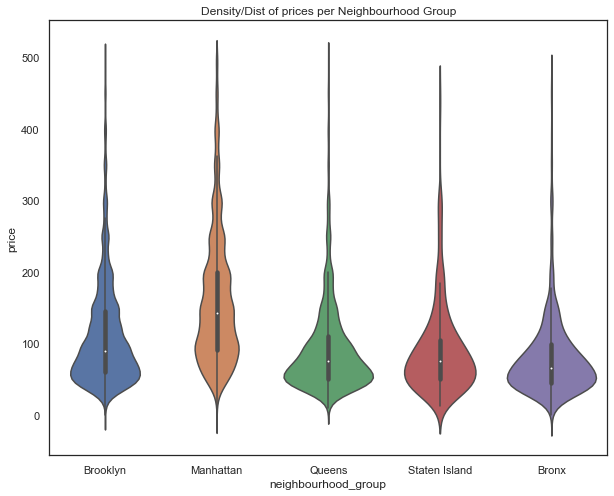

In [124]:
# the stats above indicate that we have extreme values (big outliers that can mess with the visualization)

# sub df w/ no extreme values
sub_6 = df[df.price < 500]

# violinplot to show density & distribution of prices
viz_2 = sns.violinplot(data=sub_6, x='neighbourhood_group', y='price')
viz_2.set_title('Density/Dist of prices per Neighbourhood Group')

In [125]:
# as there are too many actual neighbourhoods to concentrate on, we'll take top 10 for ease
df.neighbourhood.value_counts().head(10)

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
Hell's Kitchen        1958
East Village          1853
Upper East Side       1798
Crown Heights         1564
Midtown               1545
Name: neighbourhood, dtype: int64

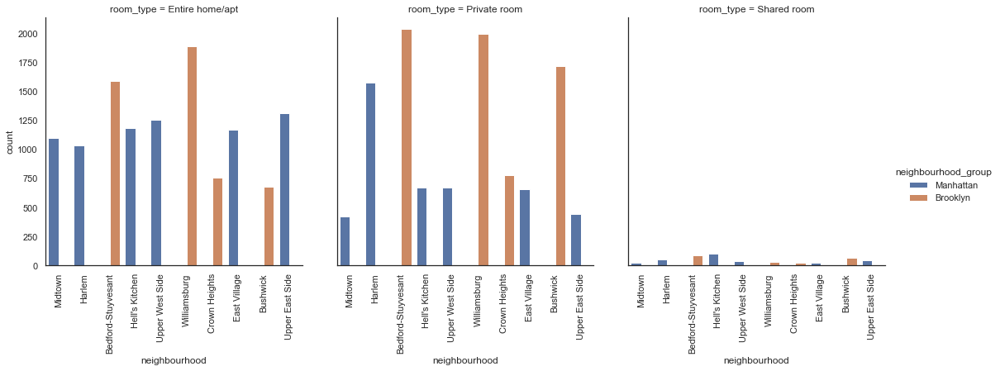

In [126]:
# combine Neighbourhood w/ Room Type for rich viz

# top 10 neighb
sub_7 = df.loc[df['neighbourhood'].isin(['Williamsburg',
    'Bedford-Stuyvesant',
    'Harlem',
    'Bushwick',
    'Upper West Side',
    'Hell\'s Kitchen',
    'East Village', 
    'Upper East Side',
    'Crown Heights',  
    'Midtown'])]

viz_3 = sns.catplot(x='neighbourhood', hue='neighbourhood_group', col='room_type',
    data=sub_7, kind='count')    
    
viz_3.set_xticklabels(rotation=90)    

In [127]:
# w/ this, Harlem is one of the most popular for Manhattan; and, BS & Williamsburg for Brooklyn

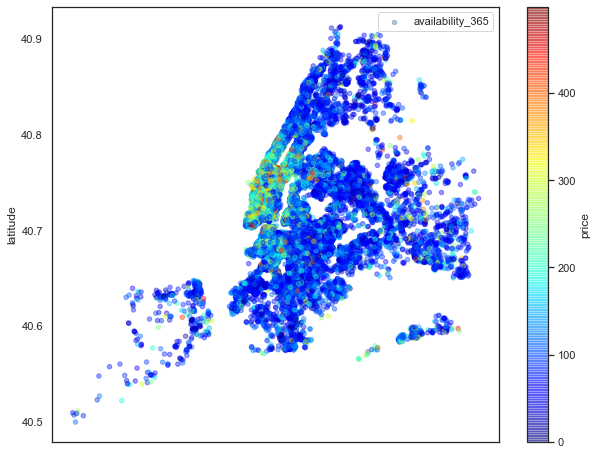

In [128]:
# scatter plot for prices & density in availability
viz_4 = sub_6.plot(kind='scatter', x='longitude', y='latitude', label='availability_365', c='price', cmap=plt.get_cmap('jet'),  colorbar=True, alpha=0.4, figsize=(10,8))

viz_4.legend()

In [140]:
from collections import Counter

# empty list to put name strings
_names_ = []

# append all names
for name in df.name:
    _names_.append(name)

# func to split all strings into separate strings
def split_name(name):
    spl = str(name).split()
    return spl

# empty list for count of substrings (words)
_names_for_count_ = []

# get name str, use split func, append to list above
for x in _names_:
    for word in split_name(x):
        word = word.lower()
        _names_for_count_.append(word)

# top 25 for viz
top_25 = Counter(_names_for_count_).most_common()
top_25 = top_25[0:25]

# new df for viz
sub_25 = pd.DataFrame(top_25)
sub_25.rename(columns={0: 'Words', 1: 'Count'}, inplace=True)
sub_25.head()

,Words,Count
0,in,16733
1,room,9389
2,bedroom,7231
3,private,6985
4,apartment,6113


[Text(0, 0, 'in'),
 Text(1, 0, 'room'),
 Text(2, 0, 'bedroom'),
 Text(3, 0, 'private'),
 Text(4, 0, 'apartment'),
 Text(5, 0, 'cozy'),
 Text(6, 0, 'the'),
 Text(7, 0, 'to'),
 Text(8, 0, 'studio'),
 Text(9, 0, 'brooklyn'),
 Text(10, 0, 'apt'),
 Text(11, 0, 'spacious'),
 Text(12, 0, '1'),
 Text(13, 0, 'with'),
 Text(14, 0, '2'),
 Text(15, 0, 'of'),
 Text(16, 0, 'east'),
 Text(17, 0, 'and'),
 Text(18, 0, 'manhattan'),
 Text(19, 0, '&'),
 Text(20, 0, 'park'),
 Text(21, 0, 'sunny'),
 Text(22, 0, 'beautiful'),
 Text(23, 0, 'near'),
 Text(24, 0, 'williamsburg')]

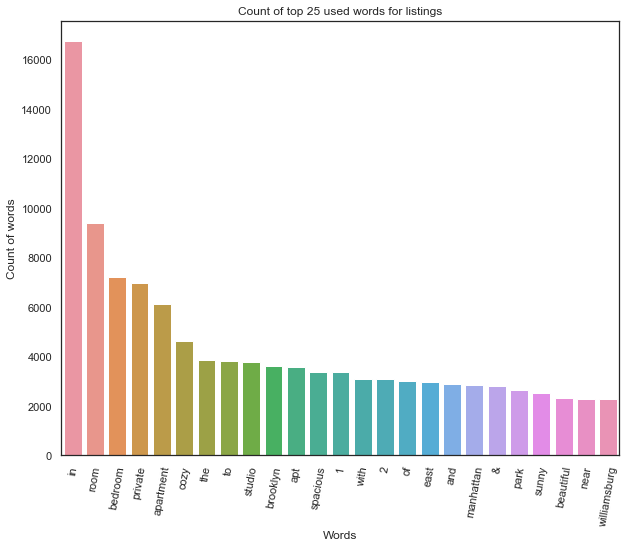

In [144]:
# barplot for viz
viz_5 = sns.barplot(x='Words', y='Count', data=sub_25)
viz_5.set_title('Count of top 25 used words for listings')
viz_5.set_ylabel('Count of words')
viz_5.set_xlabel('Words')
viz_5.set_xticklabels(viz_5.get_xticklabels(), rotation=80)

In [146]:
# top 10 reviews
top_reviews = df.nlargest(10, 'number_of_reviews')
top_reviews

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
11759,Room near JFK Queen Bed,47621202,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,14.58,2,333
2031,Great Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,7.75,3,293
2030,Beautiful Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,7.72,3,342
2015,Private Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,7.57,3,339
13495,Room Near JFK Twin Beds,47621202,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,13.40,2,173
10623,Steps away from Laguardia airport,37312959,Queens,East Elmhurst,40.77006,-73.87683,Private room,46,1,543,11.59,5,163
1879,Manhattan Lux Loft.Like.Love.Lots.Look !,2369681,Manhattan,Lower East Side,40.71921,-73.99116,Private room,99,2,540,6.95,1,179
20403,Cozy Room Family Home LGA Airport NO CLEANING FEE,26432133,Queens,East Elmhurst,40.76335,-73.87007,Private room,48,1,510,16.22,5,341
4870,Private brownstone studio Brooklyn,12949460,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,160,1,488,8.14,1,269
471,LG Private Room/Family Friendly,792159,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,6.70,1,0
